Image shape: (403, 302)


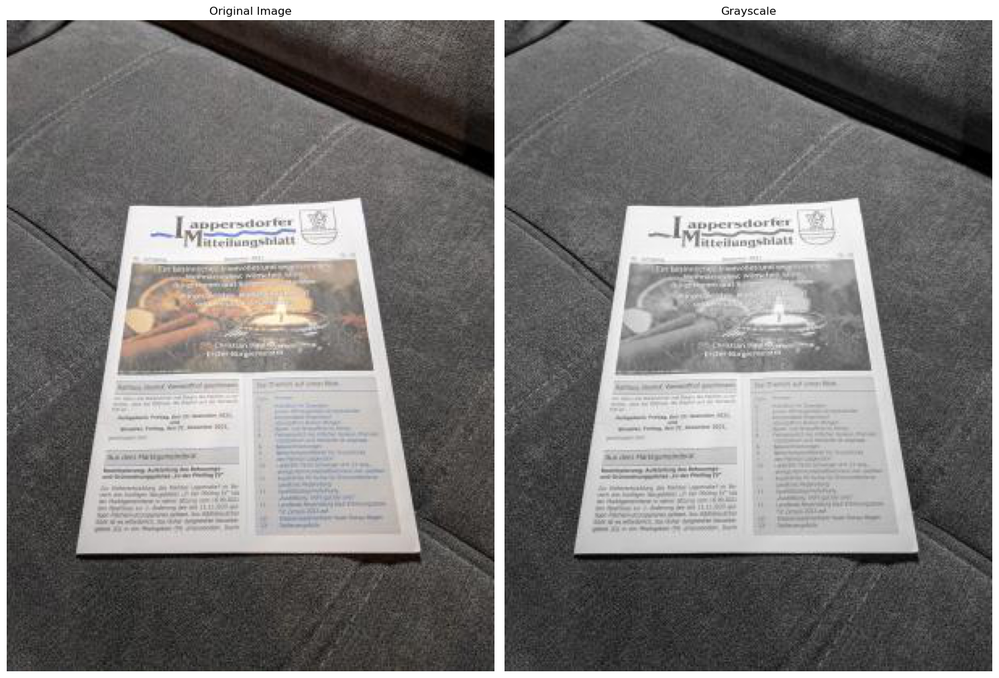

In [42]:
# HW with default pic
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

# Let's read the image
img = cv2.imread('data/document.jpg')

# Convert it to gray scale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)/255
rows, cols = gray.shape

print(f"Image shape: {gray.shape}")

# Let's plot the images (colour and gray scale)
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(122), plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')

plt.tight_layout()
plt.show()

Harris corners
Cornerness range: [-13.82, -5.20]


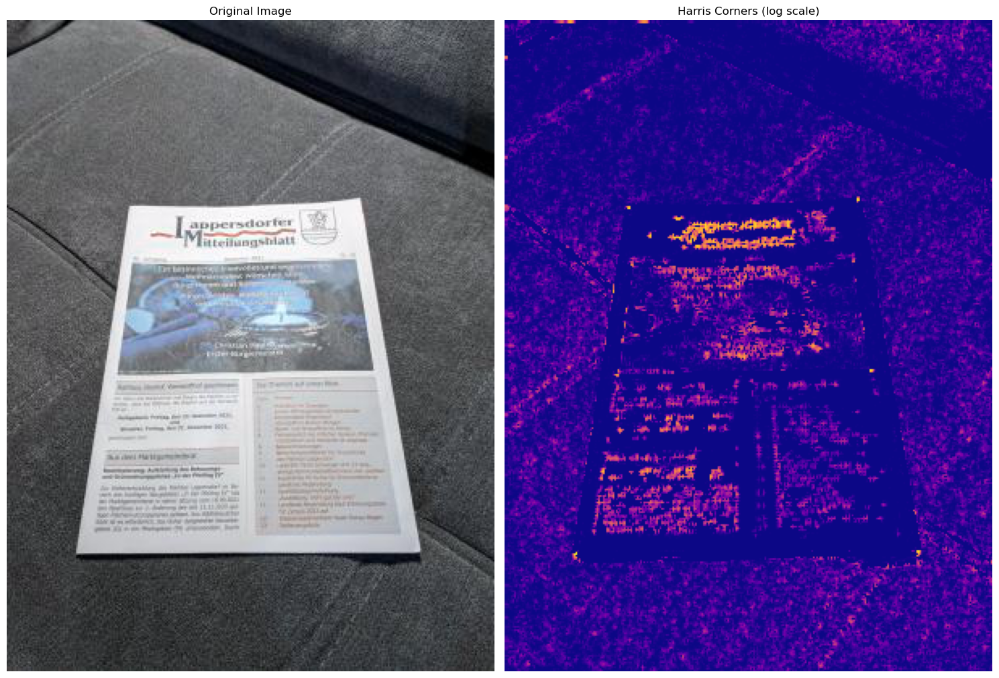

In [43]:

# Compute Harris corners
# Parameters:
#   - block size: 2 pixels
#   - gradient kernel size: 3 pixels
#   - k parameter: 0.04
cornerness = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# We are not interested in edges, so put to zero all negative cornerness values
cornerness[cornerness < 0] = 0

# Since cornerness has a huge dynamic range, let's take the logarithm
cornerness = np.log(cornerness + 1e-6)

print(f"Harris corners")
print(f"Cornerness range: [{cornerness.min():.2f}, {cornerness.max():.2f}]")

# Let's now plot the image and the corresponding Harris corners (in log scale)
plt.subplot(121), plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(122), plt.imshow(cornerness, cmap='plasma') # I tested different colormaps https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.title('Harris Corners (log scale)')
plt.axis('off')

plt.tight_layout()
plt.show()

In [46]:


# Detection thresholds
th_top_left, th_top_right = -1e6, -1e6
th_bottom_left, th_bottom_right = -1e6, -1e6

# Corner coordinates
opt_top_left, opt_top_right = None, None
opt_bottom_left, opt_bottom_right = None, None

# Size of each quadrant (in pixels)
quad_size = 7

print(f" Scanning for document corners with quad_size={quad_size}...")

# Let's now scan the Harris detection results
for r in range(quad_size, rows-quad_size):
    for c in range(quad_size, cols-quad_size):
        # Corners with too small cornerness score are discarded
        if cornerness[r, c] < -7:
            continue
        
        # Extract block consisting of 4 quadrants
        block = 255 * gray[r-quad_size:r+quad_size+1, c-quad_size:c+quad_size+1]
        
        # Extract the four quadrants
        quad_top_left = block[0:quad_size, 0:quad_size]
        quad_top_right = block[0:quad_size, quad_size+1:2*quad_size+1]
        quad_bottom_left = block[quad_size+1:2*quad_size+1, 0:quad_size]
        quad_bottom_right = block[quad_size+1:2*quad_size+1, quad_size+1:2*quad_size+1]
        
       
        # For top-left: bottom-right quadrant is bright (paper), others are dark (background)
        descriptor_tl = np.mean(quad_bottom_right) - \
                        np.mean(quad_top_left) - np.mean(quad_top_right) - np.mean(quad_bottom_left)
        
        if descriptor_tl > th_top_left:
            th_top_left = descriptor_tl
            opt_top_left = (c, r)
            
       
        # For top-right: bottom-left quadrant is bright (paper), others are dark
        descriptor_tr = np.mean(quad_bottom_left) - \
                        np.mean(quad_top_left) - np.mean(quad_top_right) - np.mean(quad_bottom_right)
        
        if descriptor_tr > th_top_right:
            th_top_right = descriptor_tr
            opt_top_right = (c, r)
     
        # For bottom-left: top-right quadrant is bright (paper), others are dark
        descriptor_bl = np.mean(quad_top_right) - \
                        np.mean(quad_top_left) - np.mean(quad_bottom_left) - np.mean(quad_bottom_right)
        
        if descriptor_bl > th_bottom_left:
            th_bottom_left = descriptor_bl
            opt_bottom_left = (c, r)
            
       
        # For bottom-right: top-left quadrant is bright (paper), others are dark
        descriptor_br = np.mean(quad_top_left) - \
                        np.mean(quad_top_right) - np.mean(quad_bottom_left) - np.mean(quad_bottom_right)
        
        if descriptor_br > th_bottom_right:
            th_bottom_right = descriptor_br
            opt_bottom_right = (c, r)

print(f"\n Corners detected:")
print(f"Top-left:     {opt_top_left}")
print(f"Top-right:    {opt_top_right}")
print(f"Bottom-left:  {opt_bottom_left}")
print(f"Bottom-right: {opt_bottom_right}")

 Scanning for document corners with quad_size=7...

 Corners detected:
Top-left:     (76, 115)
Top-right:    (219, 111)
Bottom-left:  (43, 330)
Bottom-right: (256, 329)


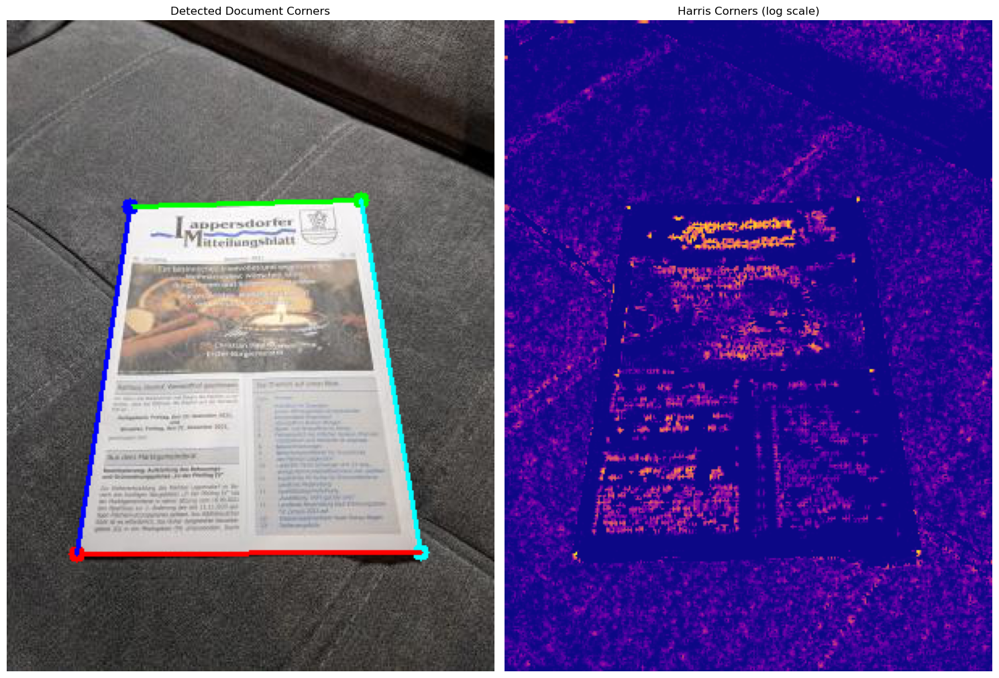

In [47]:

# draw circles at the detected corners
out = img.copy()
out = cv2.circle(out, opt_top_left, 5, (255, 0, 0), -1)
out = cv2.circle(out, opt_top_right, 5, (0, 255, 0), -1)
out = cv2.circle(out, opt_bottom_left, 5, (0, 0, 255), -1)
out = cv2.circle(out, opt_bottom_right, 5, (255, 255, 0), -1)

# Draw lines connecting corners
out = cv2.line(out, opt_top_left, opt_top_right, (0, 255, 0), 2)
out = cv2.line(out, opt_top_right, opt_bottom_right, (255, 255, 0), 2)
out = cv2.line(out, opt_bottom_right, opt_bottom_left, (0, 0, 255), 2)
out = cv2.line(out, opt_bottom_left, opt_top_left, (255, 0, 0), 2)

# Show results
plt.subplot(121), plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
plt.title('Detected Document Corners')
plt.axis('off')

plt.subplot(122), plt.imshow(cornerness, cmap='plasma')
plt.title('Harris Corners (log scale)')
plt.axis('off')

plt.tight_layout()
plt.show()

Image shape: (320, 240)


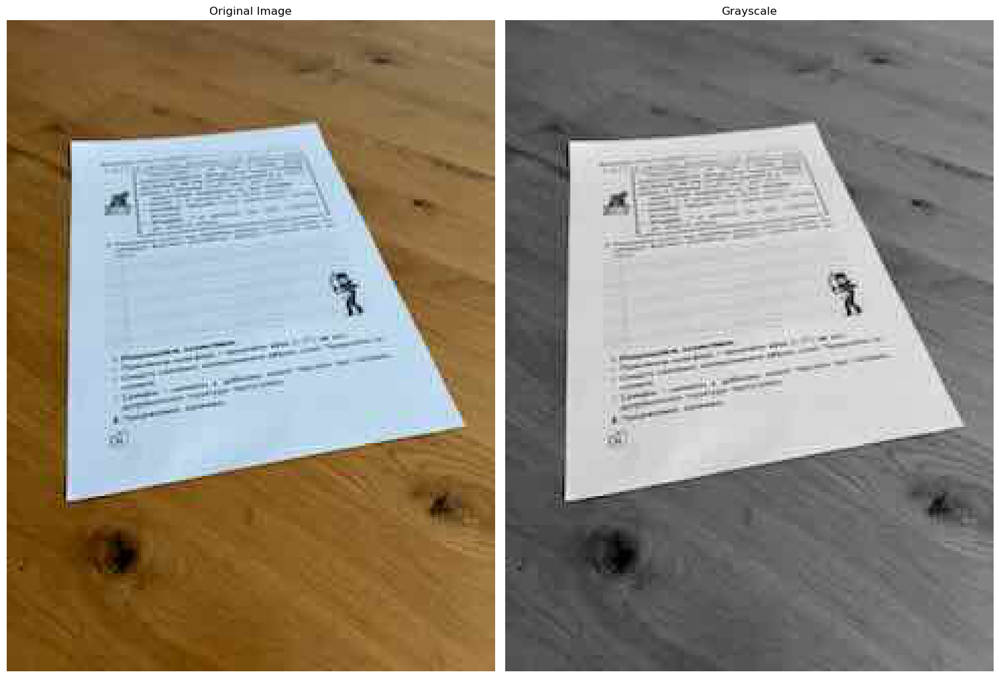

In [109]:
# HW with my pic low quility
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

# Let's read the image
img = cv2.imread('data/test1.jpeg')

# Convert it to gray scale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)/255
rows, cols = gray.shape

print(f"Image shape: {gray.shape}")

# Let's plot the images (colour and gray scale)
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(122), plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')

plt.tight_layout()
plt.show()

Harris corners
Cornerness range: [-13.82, -3.87]


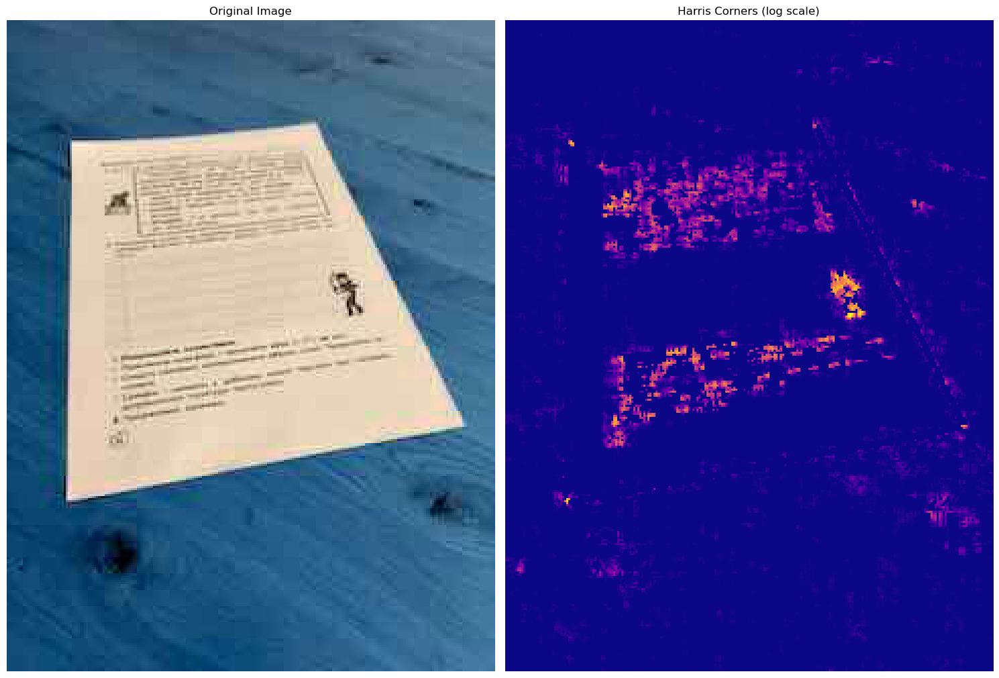

In [110]:
# Compute Harris corners
# Parameters:
#   - block size: 2 pixels
#   - gradient kernel size: 3 pixels
#   - k parameter: 0.04
cornerness = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# We are not interested in edges, so put to zero all negative cornerness values
cornerness[cornerness < 0] = 0

# Since cornerness has a huge dynamic range, let's take the logarithm
cornerness = np.log(cornerness + 1e-6)

print(f"Harris corners")
print(f"Cornerness range: [{cornerness.min():.2f}, {cornerness.max():.2f}]")

# Let's now plot the image and the corresponding Harris corners (in log scale)
plt.subplot(121), plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(122), plt.imshow(cornerness, cmap='plasma') # I tested different colormaps https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.title('Harris Corners (log scale)')
plt.axis('off')

plt.tight_layout()
plt.show()

In [111]:

# Detection thresholds
th_top_left, th_top_right = -1e6, -1e6
th_bottom_left, th_bottom_right = -1e6, -1e6

# Corner coordinates
opt_top_left, opt_top_right = None, None
opt_bottom_left, opt_bottom_right = None, None

# Size of each quadrant (in pixels)
quad_size = 7

print(f" Scanning for document corners with quad_size={quad_size}...")

# Let's now scan the Harris detection results
for r in range(quad_size, rows-quad_size):
    for c in range(quad_size, cols-quad_size):
        # Corners with too small cornerness score are discarded
        if cornerness[r, c] < -7:
            continue
        
        # Extract block consisting of 4 quadrants
        block = 255 * gray[r-quad_size:r+quad_size+1, c-quad_size:c+quad_size+1]
        
        # Extract the four quadrants
        quad_top_left = block[0:quad_size, 0:quad_size]
        quad_top_right = block[0:quad_size, quad_size+1:2*quad_size+1]
        quad_bottom_left = block[quad_size+1:2*quad_size+1, 0:quad_size]
        quad_bottom_right = block[quad_size+1:2*quad_size+1, quad_size+1:2*quad_size+1]
        
       
        # For top-left: bottom-right quadrant is bright (paper), others are dark (background)
        descriptor_tl = np.mean(quad_bottom_right) - \
                        np.mean(quad_top_left) - np.mean(quad_top_right) - np.mean(quad_bottom_left)
        
        if descriptor_tl > th_top_left:
            th_top_left = descriptor_tl
            opt_top_left = (c, r)
            
       
        # For top-right: bottom-left quadrant is bright (paper), others are dark
        descriptor_tr = np.mean(quad_bottom_left) - \
                        np.mean(quad_top_left) - np.mean(quad_top_right) - np.mean(quad_bottom_right)
        
        if descriptor_tr > th_top_right:
            th_top_right = descriptor_tr
            opt_top_right = (c, r)
     
        # For bottom-left: top-right quadrant is bright (paper), others are dark
        descriptor_bl = np.mean(quad_top_right) - \
                        np.mean(quad_top_left) - np.mean(quad_bottom_left) - np.mean(quad_bottom_right)
        
        if descriptor_bl > th_bottom_left:
            th_bottom_left = descriptor_bl
            opt_bottom_left = (c, r)
            
       
        # For bottom-right: top-left quadrant is bright (paper), others are dark
        descriptor_br = np.mean(quad_top_left) - \
                        np.mean(quad_top_right) - np.mean(quad_bottom_left) - np.mean(quad_bottom_right)
        
        if descriptor_br > th_bottom_right:
            th_bottom_right = descriptor_br
            opt_bottom_right = (c, r)

print(f"\n Corners detected:")
print(f"Top-left:     {opt_top_left}")
print(f"Top-right:    {opt_top_right}")
print(f"Bottom-left:  {opt_bottom_left}")
print(f"Bottom-right: {opt_bottom_right}")

 Scanning for document corners with quad_size=7...

 Corners detected:
Top-left:     (32, 59)
Top-right:    (163, 132)
Bottom-left:  (30, 235)
Bottom-right: (225, 199)


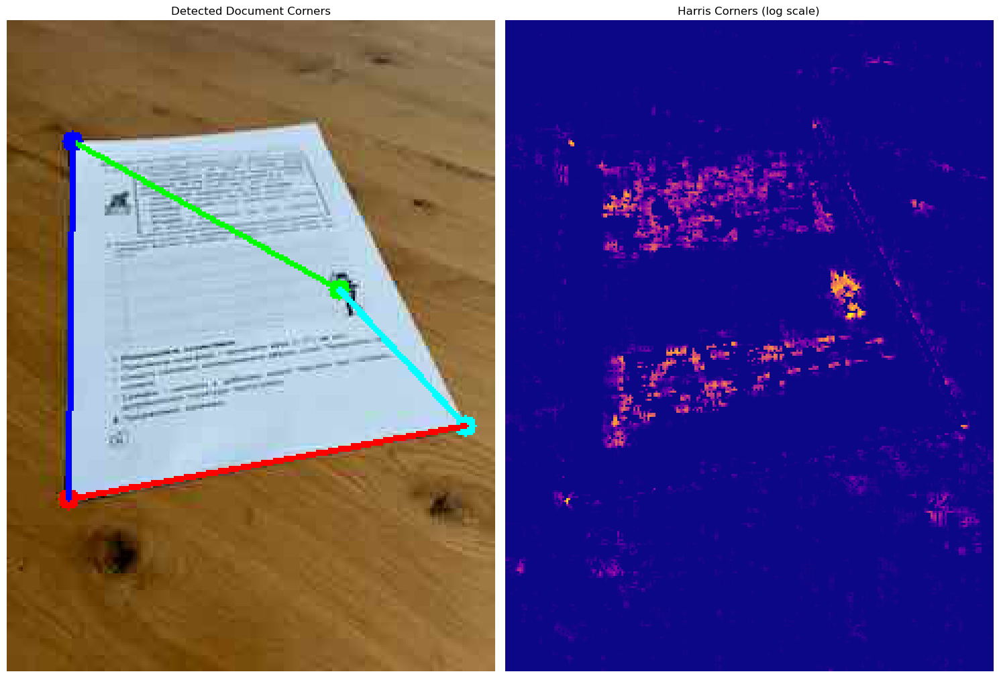

In [112]:
# draw circles at the detected corners
out = img.copy()
out = cv2.circle(out, opt_top_left, 5, (255, 0, 0), -1)
out = cv2.circle(out, opt_top_right, 5, (0, 255, 0), -1)
out = cv2.circle(out, opt_bottom_left, 5, (0, 0, 255), -1)
out = cv2.circle(out, opt_bottom_right, 5, (255, 255, 0), -1)

# Draw lines connecting corners
out = cv2.line(out, opt_top_left, opt_top_right, (0, 255, 0), 2)
out = cv2.line(out, opt_top_right, opt_bottom_right, (255, 255, 0), 2)
out = cv2.line(out, opt_bottom_right, opt_bottom_left, (0, 0, 255), 2)
out = cv2.line(out, opt_bottom_left, opt_top_left, (255, 0, 0), 2)

# Show results
plt.subplot(121), plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
plt.title('Detected Document Corners')
plt.axis('off')

plt.subplot(122), plt.imshow(cornerness, cmap='plasma')
plt.title('Harris Corners (log scale)')
plt.axis('off')

plt.tight_layout()
plt.show()

Image shape: (640, 480)


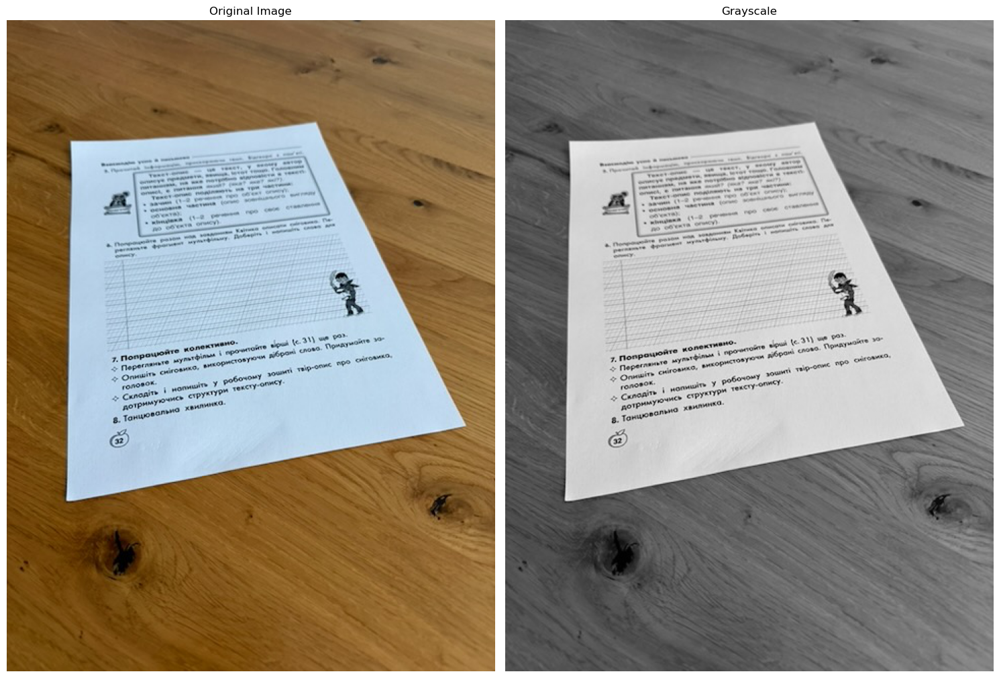

In [127]:
# HW with mid q pic
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

# Let's read the image
img = cv2.imread('data/test_mid_q.jpeg')

# Convert it to gray scale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)/255
rows, cols = gray.shape

print(f"Image shape: {gray.shape}")

# Let's plot the images (colour and gray scale)
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(122), plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')

plt.tight_layout()
plt.show()

Harris corners
Cornerness range: [-13.82, -3.48]


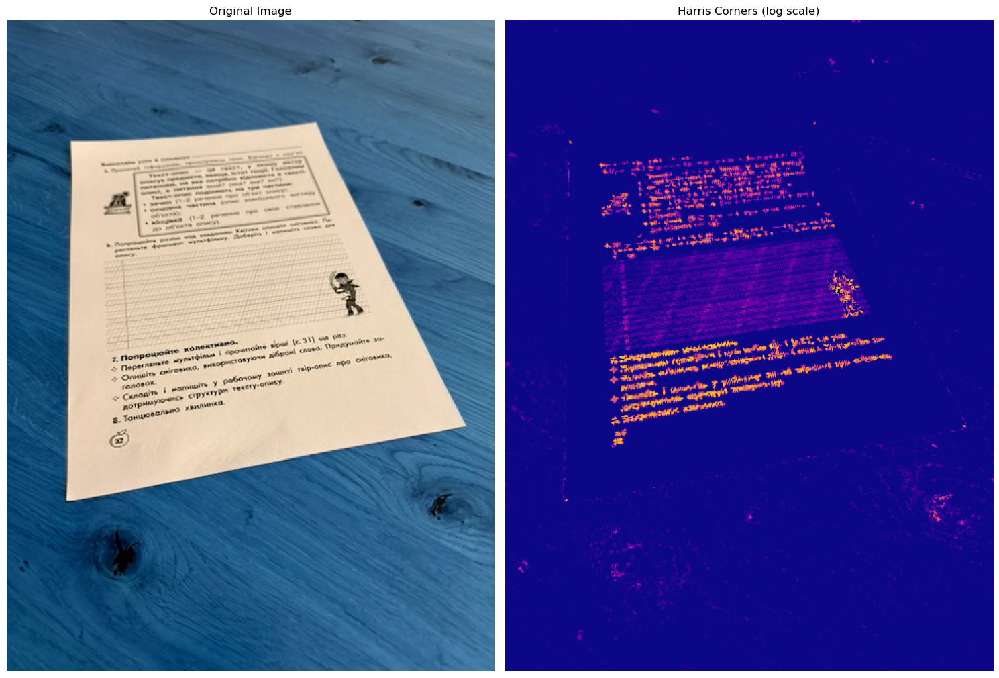

In [128]:

# Compute Harris corners
# Parameters:
#   - block size: 2 pixels
#   - gradient kernel size: 3 pixels
#   - k parameter: 0.04
cornerness = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# We are not interested in edges, so put to zero all negative cornerness values
cornerness[cornerness < 0] = 0

# Since cornerness has a huge dynamic range, let's take the logarithm
cornerness = np.log(cornerness + 1e-6)

print(f"Harris corners")
print(f"Cornerness range: [{cornerness.min():.2f}, {cornerness.max():.2f}]")

# Let's now plot the image and the corresponding Harris corners (in log scale)
plt.subplot(121), plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(122), plt.imshow(cornerness, cmap='plasma') # I tested different colormaps https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.title('Harris Corners (log scale)')
plt.axis('off')

plt.tight_layout()
plt.show()

In [129]:

# Detection thresholds
th_top_left, th_top_right = -1e6, -1e6
th_bottom_left, th_bottom_right = -1e6, -1e6

# Corner coordinates
opt_top_left, opt_top_right = None, None
opt_bottom_left, opt_bottom_right = None, None

# Size of each quadrant (in pixels)
quad_size = 7

print(f" Scanning for document corners with quad_size={quad_size}...")

# Let's now scan the Harris detection results
for r in range(quad_size, rows-quad_size):
    for c in range(quad_size, cols-quad_size):
        # Corners with too small cornerness score are discarded
        if cornerness[r, c] < -7:
            continue
        
        # Extract block consisting of 4 quadrants
        block = 255 * gray[r-quad_size:r+quad_size+1, c-quad_size:c+quad_size+1]
        
        # Extract the four quadrants
        quad_top_left = block[0:quad_size, 0:quad_size]
        quad_top_right = block[0:quad_size, quad_size+1:2*quad_size+1]
        quad_bottom_left = block[quad_size+1:2*quad_size+1, 0:quad_size]
        quad_bottom_right = block[quad_size+1:2*quad_size+1, quad_size+1:2*quad_size+1]
        
       
        # For top-left: bottom-right quadrant is bright (paper), others are dark (background)
        descriptor_tl = np.mean(quad_bottom_right) - \
                        np.mean(quad_top_left) - np.mean(quad_top_right) - np.mean(quad_bottom_left)
        
        if descriptor_tl > th_top_left:
            th_top_left = descriptor_tl
            opt_top_left = (c, r)
            
       
        # For top-right: bottom-left quadrant is bright (paper), others are dark
        descriptor_tr = np.mean(quad_bottom_left) - \
                        np.mean(quad_top_left) - np.mean(quad_top_right) - np.mean(quad_bottom_right)
        
        if descriptor_tr > th_top_right:
            th_top_right = descriptor_tr
            opt_top_right = (c, r)
     
        # For bottom-left: top-right quadrant is bright (paper), others are dark
        descriptor_bl = np.mean(quad_top_right) - \
                        np.mean(quad_top_left) - np.mean(quad_bottom_left) - np.mean(quad_bottom_right)
        
        if descriptor_bl > th_bottom_left:
            th_bottom_left = descriptor_bl
            opt_bottom_left = (c, r)
            
       
        # For bottom-right: top-left quadrant is bright (paper), others are dark
        descriptor_br = np.mean(quad_top_left) - \
                        np.mean(quad_top_right) - np.mean(quad_bottom_left) - np.mean(quad_bottom_right)
        
        if descriptor_br > th_bottom_right:
            th_bottom_right = descriptor_br
            opt_bottom_right = (c, r)

print(f"\n Corners detected:")
print(f"Top-left:     {opt_top_left}")
print(f"Top-right:    {opt_top_right}")
print(f"Bottom-left:  {opt_bottom_left}")
print(f"Bottom-right: {opt_bottom_right}")

 Scanning for document corners with quad_size=7...

 Corners detected:
Top-left:     (63, 119)
Top-right:    (333, 267)
Bottom-left:  (59, 472)
Bottom-right: (335, 275)


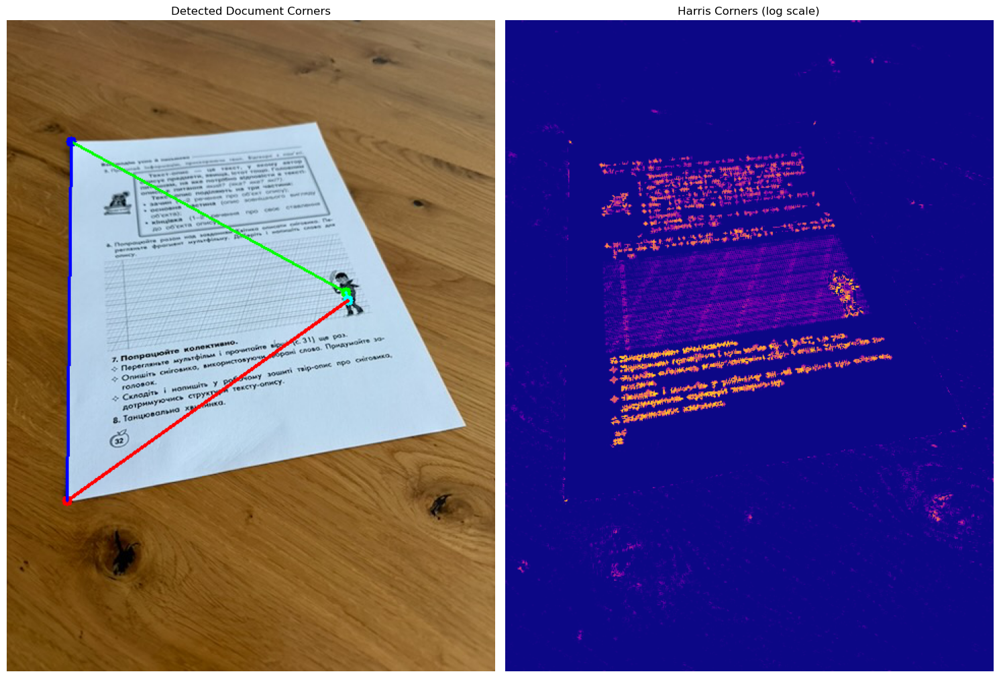

In [130]:
# draw circles at the detected corners
out = img.copy()
out = cv2.circle(out, opt_top_left, 5, (255, 0, 0), -1)
out = cv2.circle(out, opt_top_right, 5, (0, 255, 0), -1)
out = cv2.circle(out, opt_bottom_left, 5, (0, 0, 255), -1)
out = cv2.circle(out, opt_bottom_right, 5, (255, 255, 0), -1)

# Draw lines connecting corners
out = cv2.line(out, opt_top_left, opt_top_right, (0, 255, 0), 2)
out = cv2.line(out, opt_top_right, opt_bottom_right, (255, 255, 0), 2)
out = cv2.line(out, opt_bottom_right, opt_bottom_left, (0, 0, 255), 2)
out = cv2.line(out, opt_bottom_left, opt_top_left, (255, 0, 0), 2)

# Show results
plt.subplot(121), plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
plt.title('Detected Document Corners')
plt.axis('off')

plt.subplot(122), plt.imshow(cornerness, cmap='plasma')
plt.title('Harris Corners (log scale)')
plt.axis('off')

plt.tight_layout()
plt.show()

Image shape: 640x480


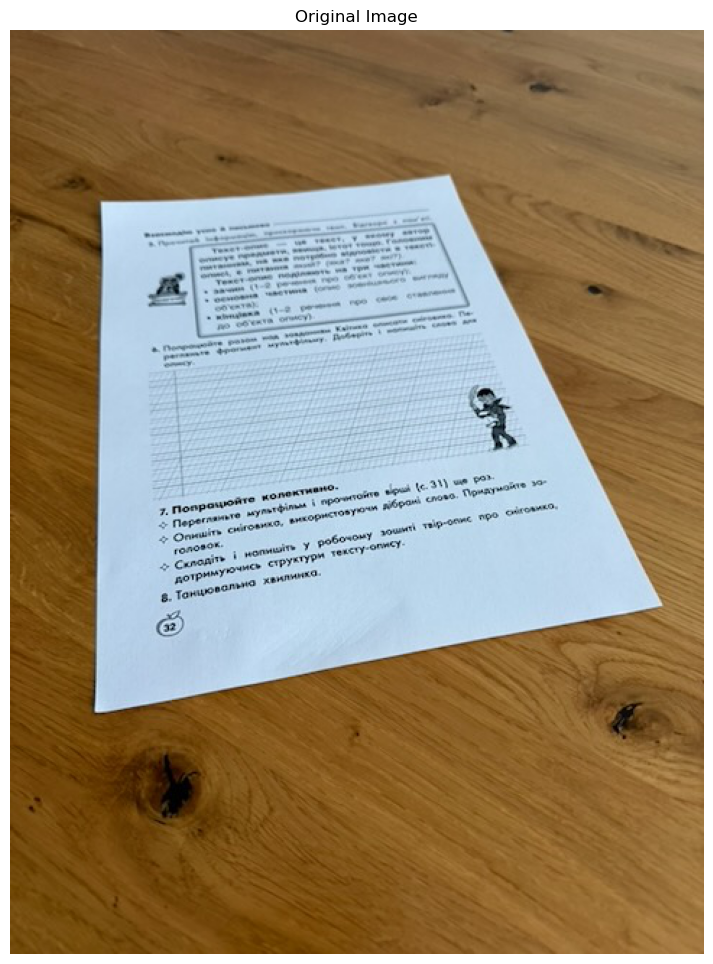

In [144]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [20, 12]

# Load image
img = cv2.imread('data/test_mid_q.jpeg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
rows, cols = gray.shape

print(f"Image shape: {rows}x{cols}")

plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')
plt.show()

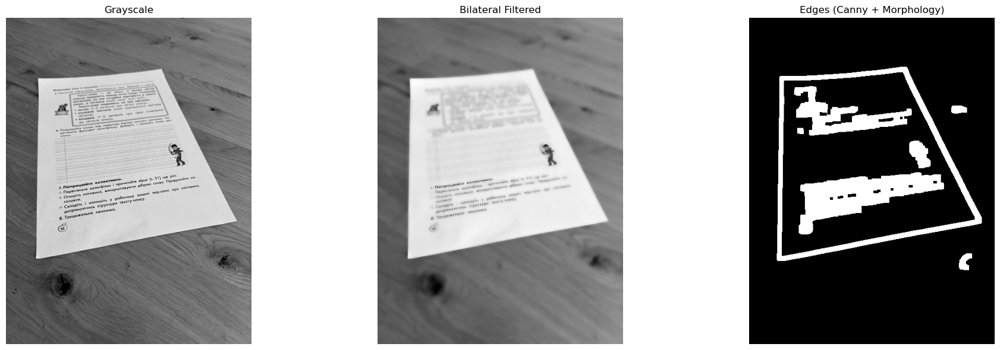

In [145]:


# Bilateral filter - https://www.youtube.com/watch?v=LjbYKWAQA5s
bilateral = cv2.bilateralFilter(gray, 11, 80, 80)

# Canny edges
edges = cv2.Canny(bilateral, 30, 90)

# Morphology
kernel = np.ones((5,5), np.uint8)
edges_closed = cv2.dilate(edges, kernel, iterations=3)
edges_closed = cv2.erode(edges_closed, kernel, iterations=1)

# Show results
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Grayscale')
axes[0].axis('off')

axes[1].imshow(bilateral, cmap='gray')
axes[1].set_title('Bilateral Filtered')
axes[1].axis('off')

axes[2].imshow(edges_closed, cmap='gray')
axes[2].set_title('Edges (Canny + Morphology)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

Found 3 contours
Contour 1: area = 111726
Contour 2: area = 504
Contour 3: area = 388


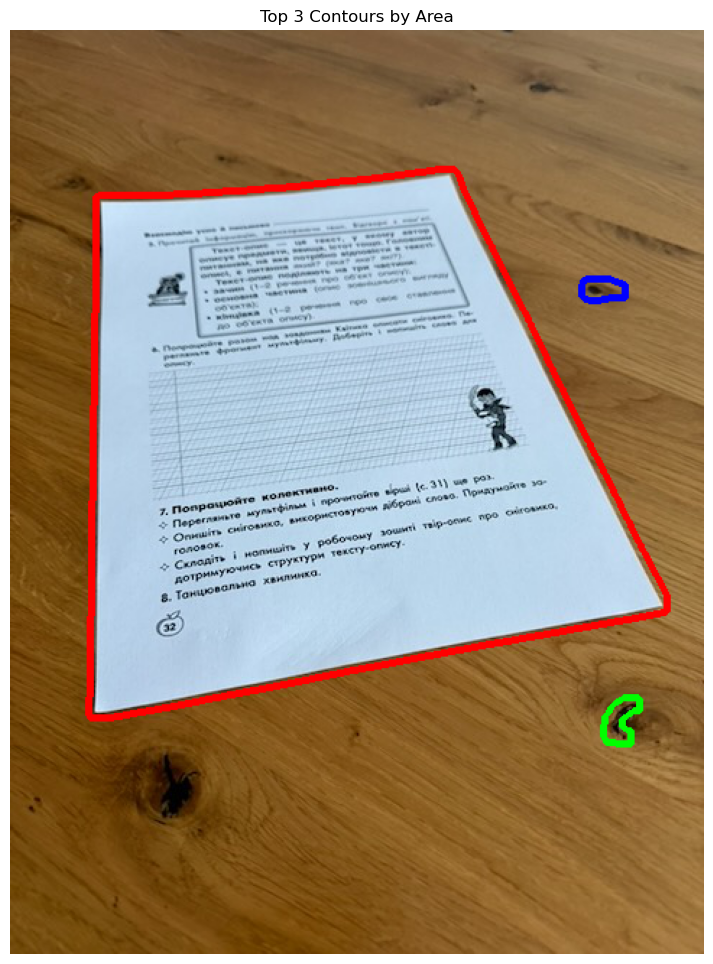

In [147]:
# Find Contours https://www.youtube.com/watch?v=JfaZNiEbreE&list=PLCeWwpzjQu9gc9C9-iZ9WTFNGhIq4-L1X

contours, _ = cv2.findContours(edges_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print(f"Found {len(contours)} contours")

# Sorted contours
sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)

# Show results
out_contours = img_rgb.copy()
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]

for i, contour in enumerate(sorted_contours[:3]):
    area = cv2.contourArea(contour)
    cv2.drawContours(out_contours, [contour], -1, colors[i], 3)
    print(f"Contour {i+1}: area = {area:.0f}")

plt.imshow(out_contours)
plt.title('Top 3 Contours by Area')
plt.axis('off')
plt.show()

In [148]:
# Find corners

def find_document_corners(contour, img_shape):
    """Find corners"""
    
    peri = cv2.arcLength(contour, True)
    
    # epsilon
    for epsilon_factor in [0.02, 0.03, 0.05, 0.07, 0.10]:
        approx = cv2.approxPolyDP(contour, epsilon_factor * peri, True)
        
        if len(approx) == 4:
            print(f"  Found 4 vertices with epsilon={epsilon_factor:.2f}")
            return approx.reshape(4, 2)
    
    # If no corners use x-tream points
    print(f"  No 4-vertex approximation, using extreme points")
    approx = cv2.approxPolyDP(contour, 0.02 * peri, True)
    corners = approx.reshape(-1, 2)
    
    # 4 corners
    points_sum = corners.sum(axis=1)
    points_diff = np.diff(corners, axis=1).flatten()
    
    tl = corners[np.argmin(points_sum)]
    br = corners[np.argmax(points_sum)]
    tr = corners[np.argmin(points_diff)]
    bl = corners[np.argmax(points_diff)]
    
    return np.array([tl, tr, br, bl])

best_contour = sorted_contours[0]
corners = find_document_corners(best_contour, img_rgb.shape)

print(f"\nDocument corners found:")
print(f"Top-left:     {corners[0]}")
print(f"Top-right:    {corners[1]}")
print(f"Bottom-right: {corners[2]}")
print(f"Bottom-left:  {corners[3]}")

  Found 4 vertices with epsilon=0.02

Document corners found:
Top-left:     [307  96]
Top-right:    [ 59 115]
Bottom-right: [ 55 476]
Bottom-left:  [454 402]


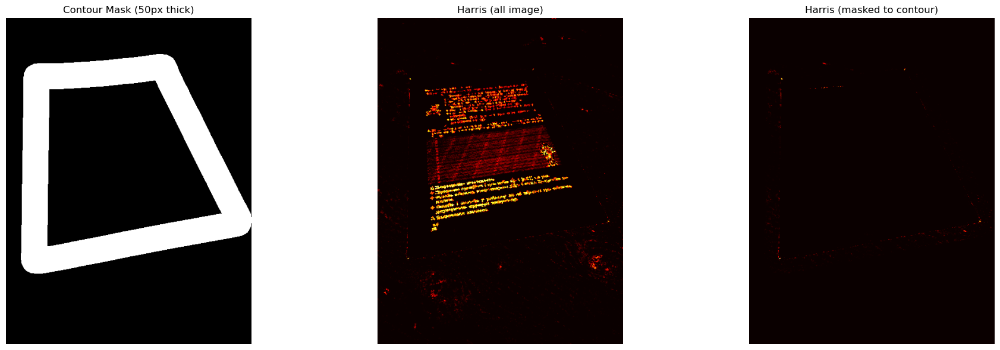

In [150]:

#Create contour mask
contour_mask = np.zeros_like(gray, dtype=np.uint8)
cv2.drawContours(contour_mask, [best_contour], -1, 255, thickness=50)  # Товста лінія

# Harris corners
gray_float = np.float32(gray) / 255
cornerness = cv2.cornerHarris(gray_float, blockSize=2, ksize=3, k=0.04)
cornerness[cornerness < 0] = 0

# Apply mask - Harris for contour
cornerness_masked = cornerness * (contour_mask / 255.0)
cornerness_masked = np.log(cornerness_masked + 1e-6)

# Show results
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

axes[0].imshow(contour_mask, cmap='gray')
axes[0].set_title('Contour Mask (50px thick)')
axes[0].axis('off')

axes[1].imshow(np.log(cornerness + 1e-6), cmap='hot')
axes[1].set_title('Harris (all image)')
axes[1].axis('off')

axes[2].imshow(cornerness_masked, cmap='hot')
axes[2].set_title('Harris (masked to contour)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

In [154]:

# Define Harris corner

def refine_corner_with_harris(corner, cornerness, search_radius=30):
    """Clarif corner Harris in area"""
    r, c = corner[1], corner[0]  # corner = (x, y)
    
    # Define zone of search
    r_min = max(0, r - search_radius)
    r_max = min(cornerness.shape[0], r + search_radius)
    c_min = max(0, c - search_radius)
    c_max = min(cornerness.shape[1], c + search_radius)
    
    # Define Harris in area
    region = cornerness[r_min:r_max, c_min:c_max]
    
    if region.size == 0:
        return corner
    
    local_max = np.unravel_index(np.argmax(region), region.shape)
    
    # Refined in coordinates
    refined_r = r_min + local_max[0]
    refined_c = c_min + local_max[1]
    
    return np.array([refined_c, refined_r])

# Clarify 4 corners
refined_corners = []
for i, corner in enumerate(corners):
    refined = refine_corner_with_harris(corner, cornerness, search_radius=40)
    refined_corners.append(refined)
    print(f"Corner {i}: {corner} → {refined} (shift: {np.linalg.norm(refined - corner):.1f}px)")

refined_corners = np.array(refined_corners)

Corner 0: [307  96] → [304 101] (shift: 5.8px)
Corner 1: [ 59 115] → [ 64 120] (shift: 7.1px)
Corner 2: [ 55 476] → [ 59 472] (shift: 5.7px)
Corner 3: [454 402] → [451 398] (shift: 5.0px)


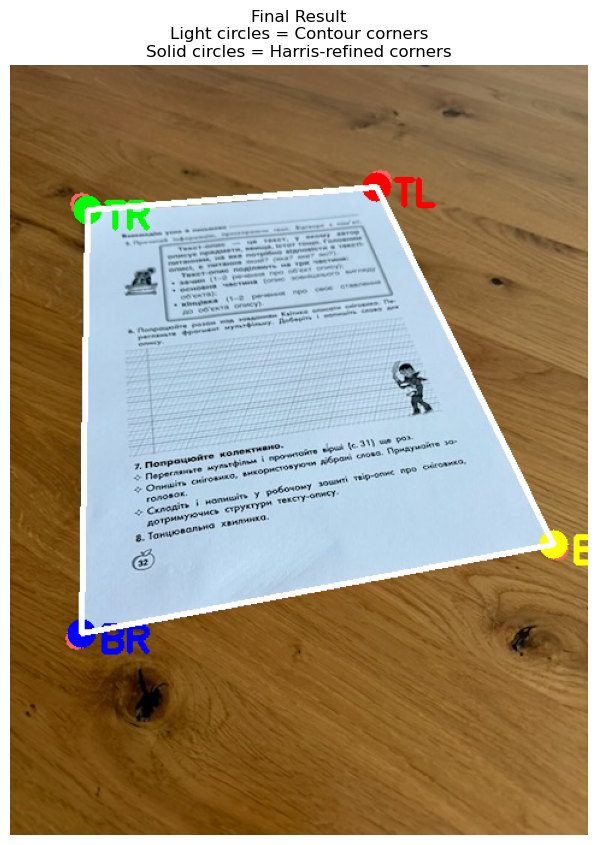


Final corners:
TL: [304 101]
TR: [ 64 120]
BR: [ 59 472]
BL: [451 398]


In [156]:
# Show results

out = img_rgb.copy()

# Draw circles
for corner in corners:
    cv2.circle(out, tuple(corner), 8, (255, 100, 100), 2)

# Harries corners 
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0)]
labels = ['TL', 'TR', 'BR', 'BL']

for i, (corner, color, label) in enumerate(zip(refined_corners, colors, labels)):
    cv2.circle(out, tuple(corner), 12, color, -1)
    cv2.putText(out, label, tuple(corner + [15, 15]), 
               cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)

# COnnect in line
corners_poly = refined_corners.reshape((-1, 1, 2)).astype(np.int32)
cv2.polylines(out, [corners_poly], True, (255, 255, 255), 3)

plt.figure(figsize=(15, 10))
plt.imshow(out)
plt.title('Final Result\nLight circles = Contour corners\nSolid circles = Harris-refined corners')
plt.axis('off')
plt.show()

print(f"\nFinal corners:")
for i, (corner, label) in enumerate(zip(refined_corners, labels)):
    print(f"{label}: {corner}")